In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

In [3]:
class Generator(nn.Module):
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim

        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    return torch.randn(n_samples, input_dim, device=device)

In [4]:
class Discriminator(nn.Module):
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [5]:
import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    return F.one_hot(labels,n_classes)

In [6]:
def combine_vectors(x, y):
    combined = torch.cat((x.float(),y.float()), 1)
    return combined

In [7]:
mnist_shape = (1, 28, 28)
n_classes = 10
criterion = nn.BCEWithLogitsLoss()
n_epochs = 50
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:02<00:00, 4509390.14it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 57242.27it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:01<00:00, 1276518.99it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 11455519.40it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [8]:
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0] + n_classes
    return generator_input_dim, discriminator_im_chan

In [9]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  0%|          | 0/469 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 2.0271753507852552, discriminator loss: 0.2835233465768397


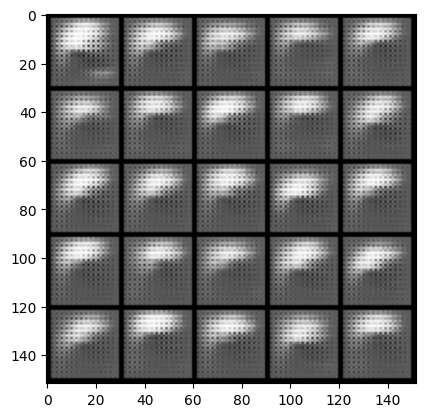

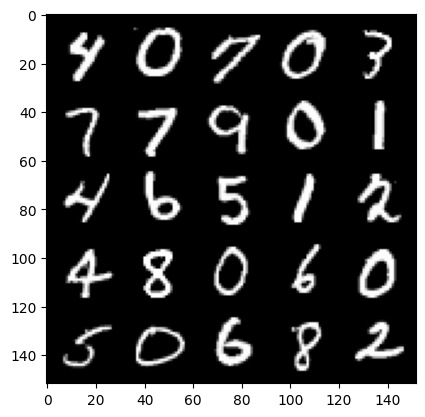

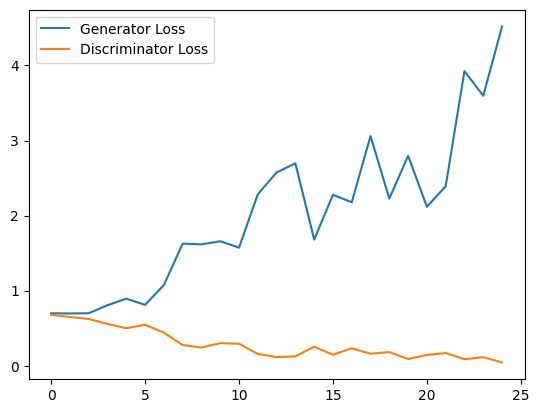

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 4.426097855091095, discriminator loss: 0.06804113506525755


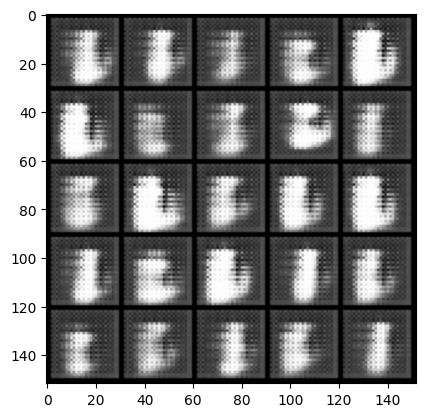

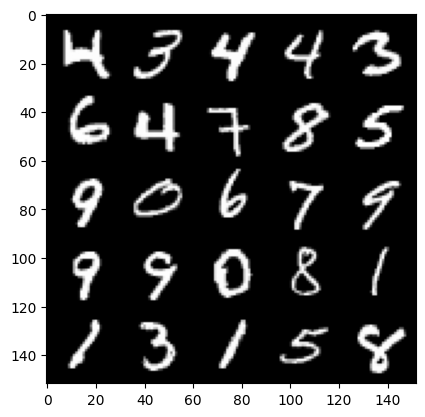

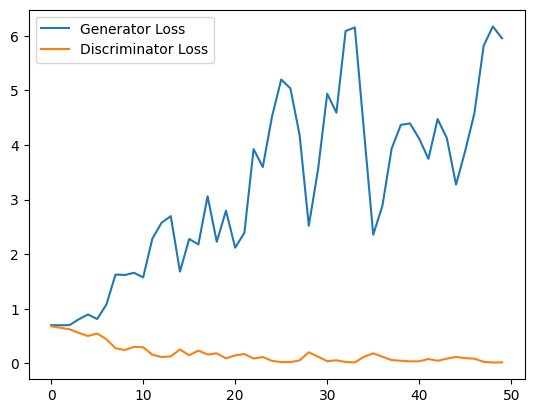

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 4.255142765998841, discriminator loss: 0.056756544924341144


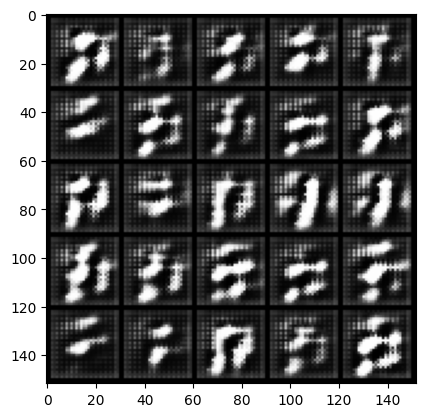

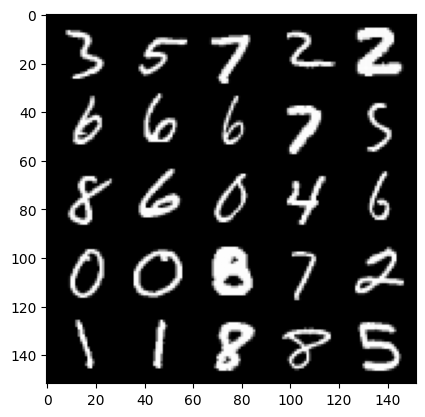

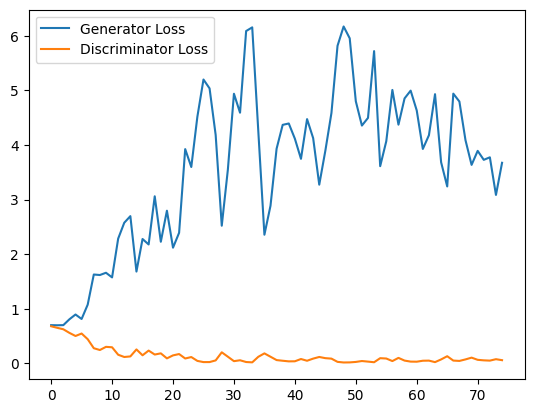

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 3.45137055850029, discriminator loss: 0.10759284314885735


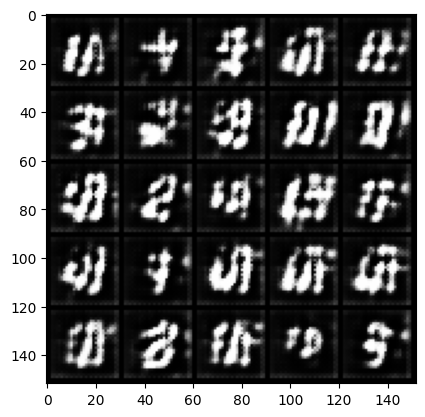

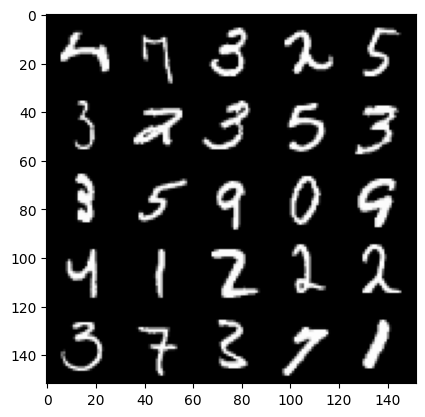

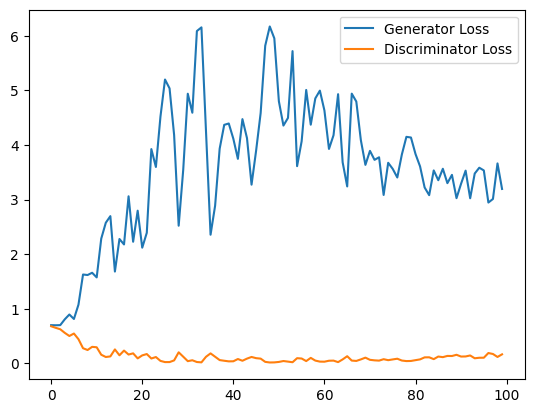

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 2.8316019649505617, discriminator loss: 0.20858489294350147


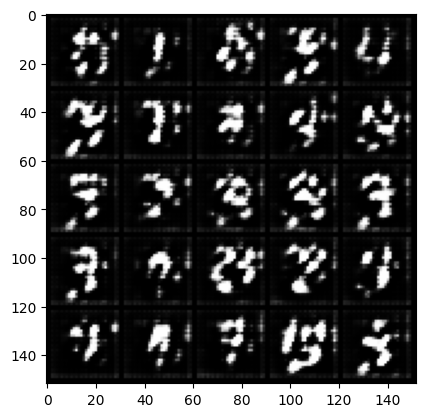

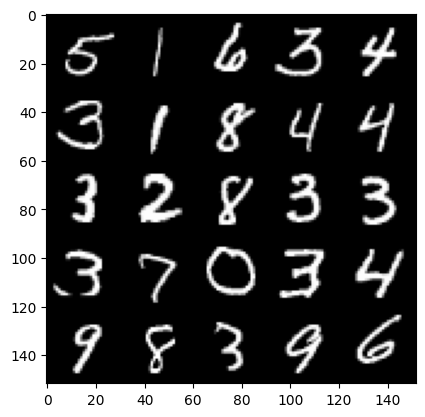

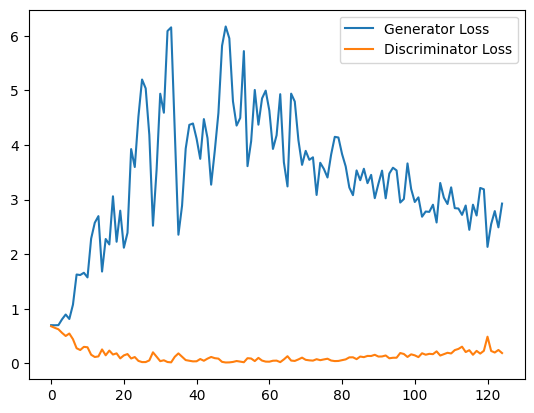

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.4281765406131743, discriminator loss: 0.2253547312617302


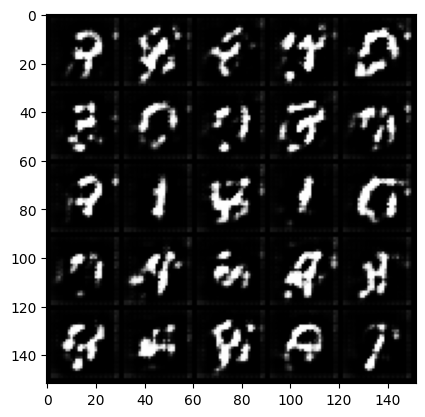

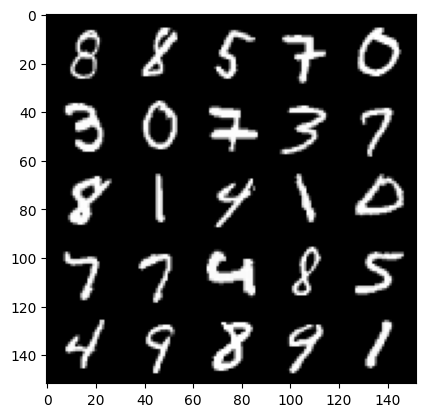

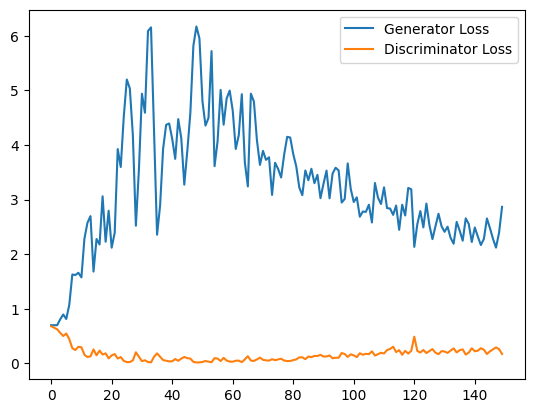

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.4351381680965423, discriminator loss: 0.2649770774245262


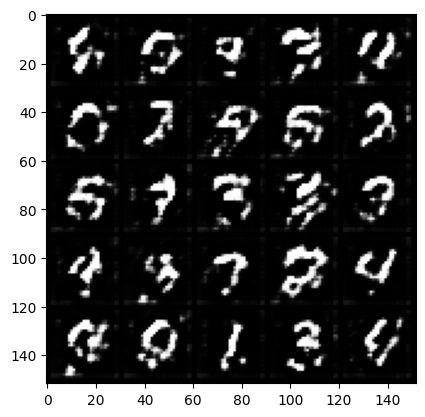

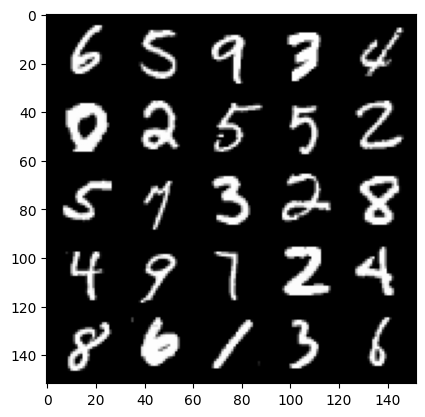

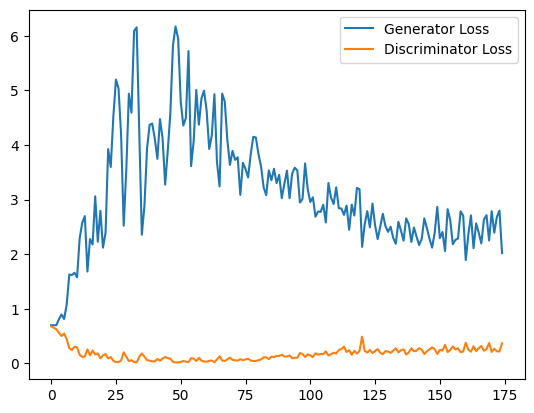

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.463794849395752, discriminator loss: 0.27614688435196877


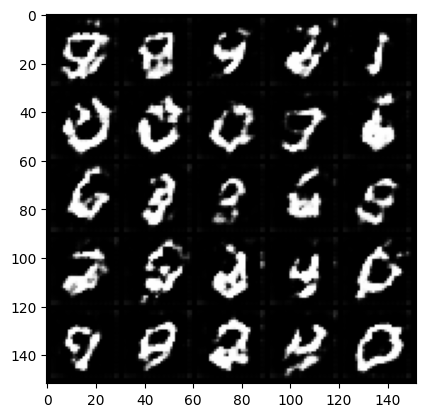

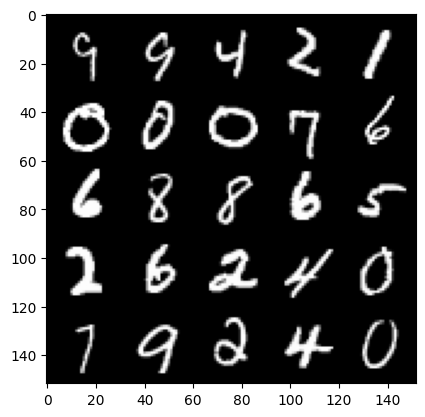

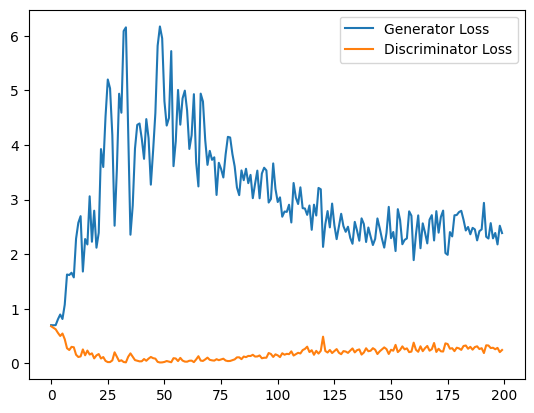

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 2.201616735100746, discriminator loss: 0.27861478507518767


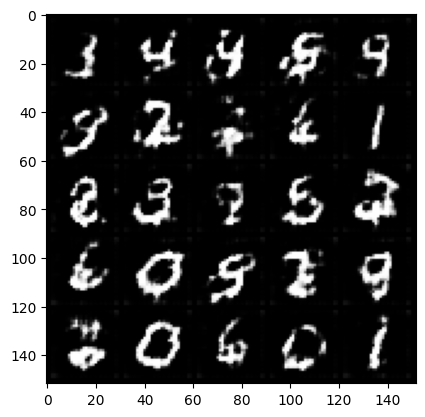

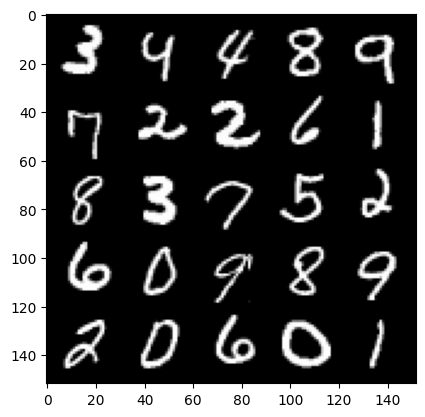

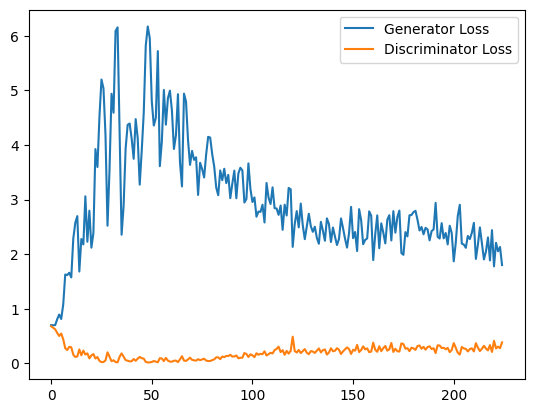

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 2.1197813591957093, discriminator loss: 0.3187790580689907


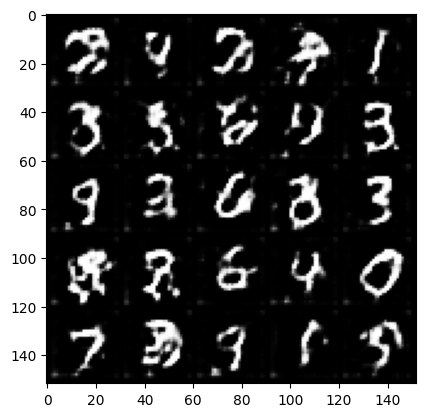

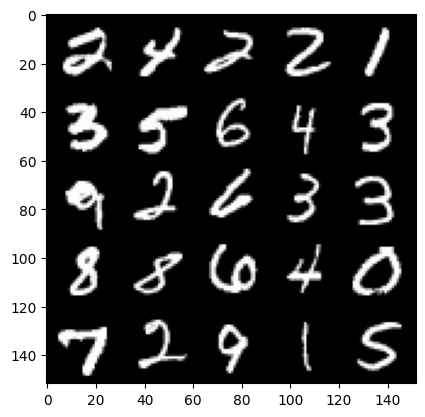

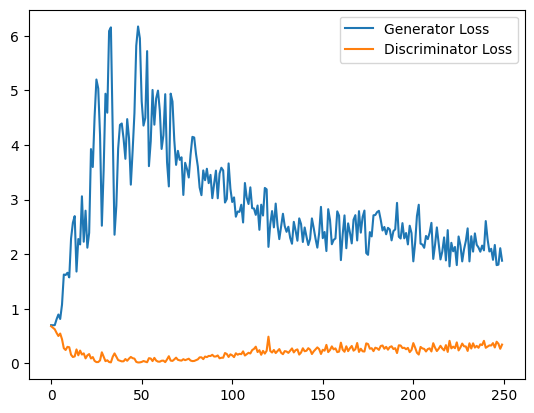

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 1.9310788033008575, discriminator loss: 0.3389160319566727


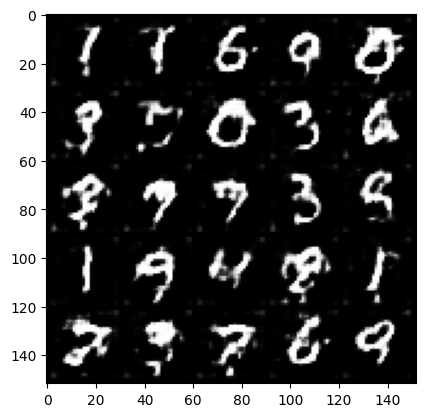

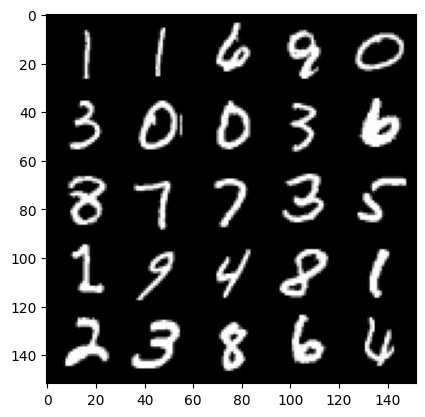

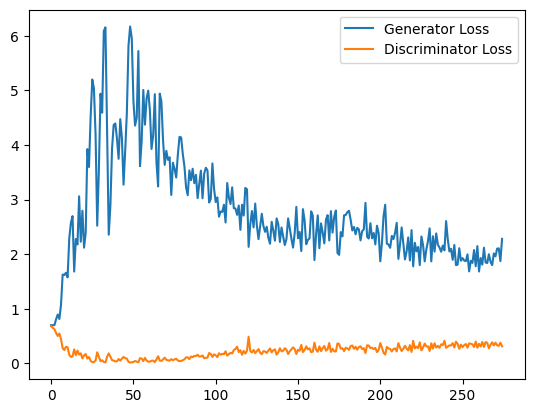

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 1.8919677929878236, discriminator loss: 0.35085233810544014


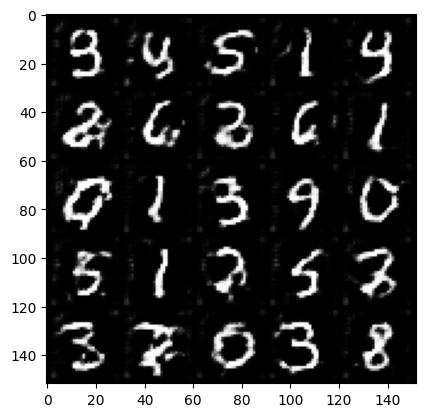

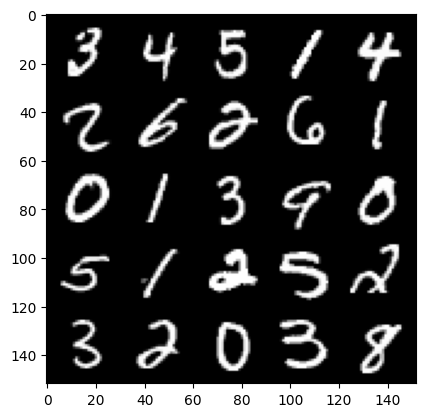

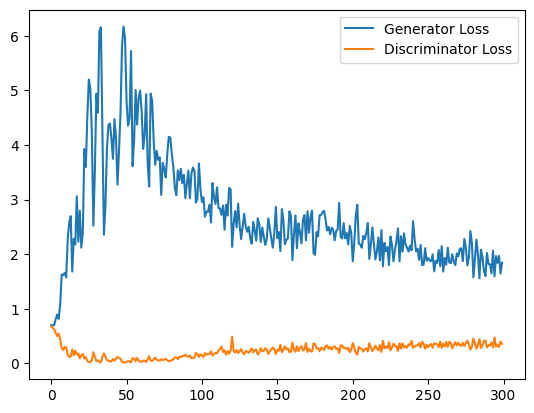

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 1.7714832792282105, discriminator loss: 0.37613172656297683


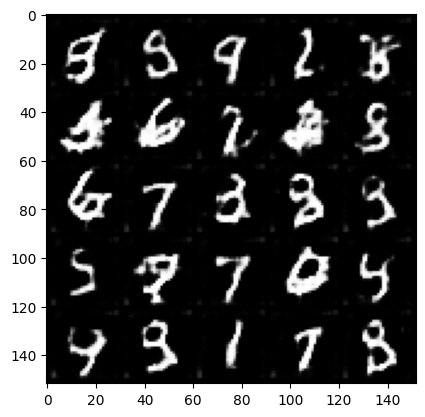

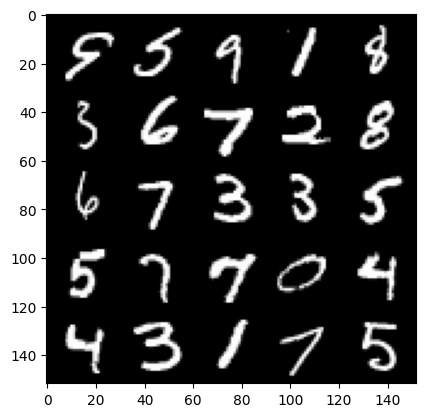

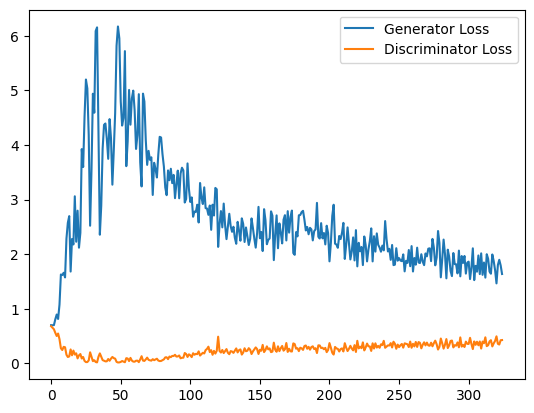

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 1.7050616388320923, discriminator loss: 0.417287028491497


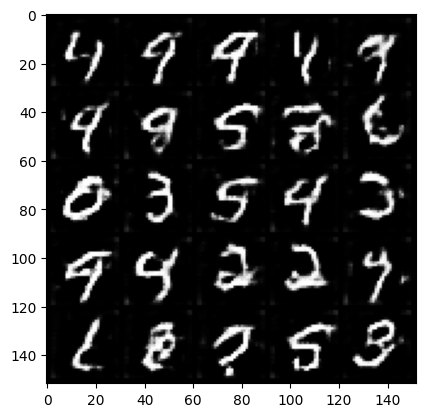

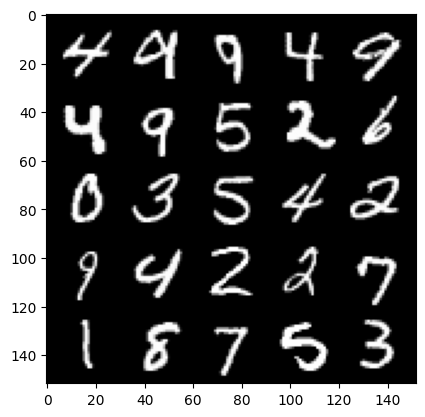

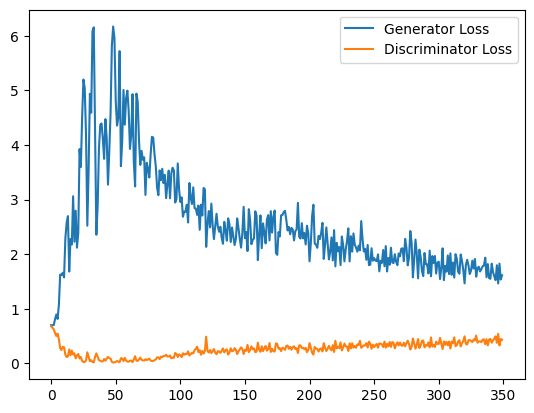

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 1.5939648094177246, discriminator loss: 0.43824219453334806


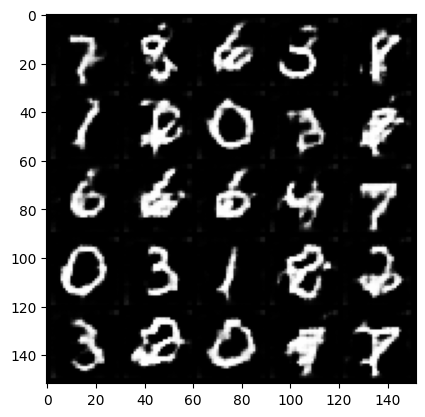

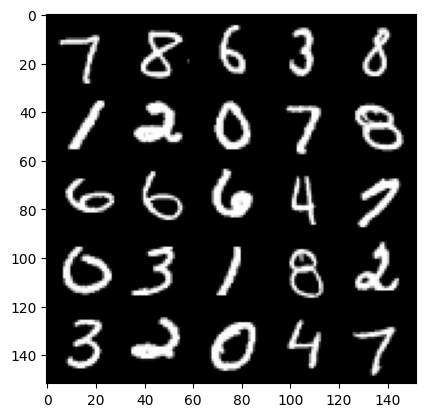

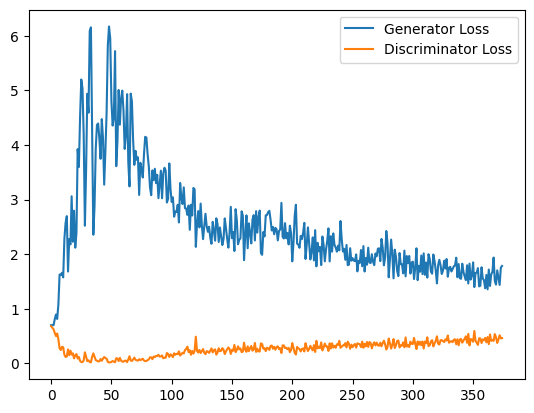

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 1.6036847232580185, discriminator loss: 0.45136117523908614


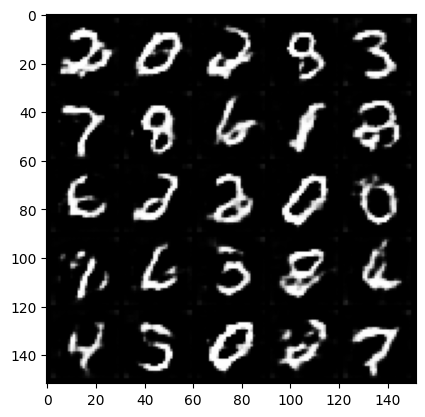

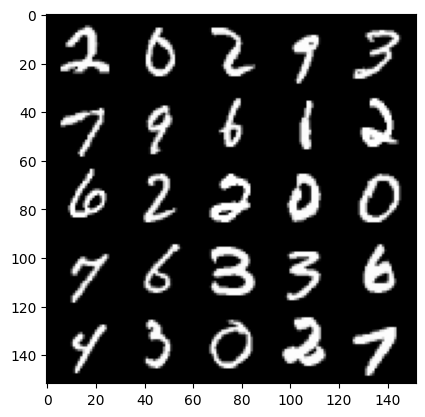

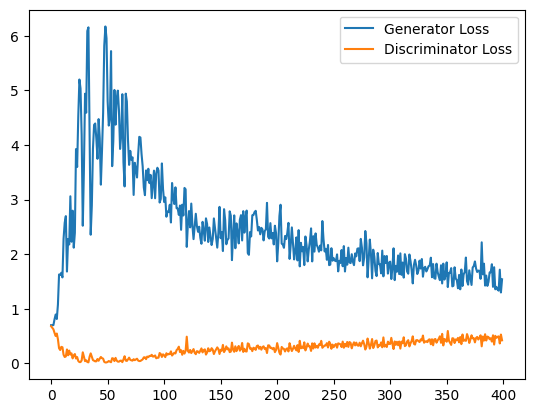

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 1.4262392842769622, discriminator loss: 0.479599718272686


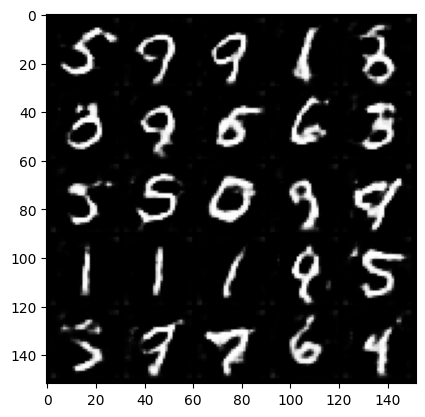

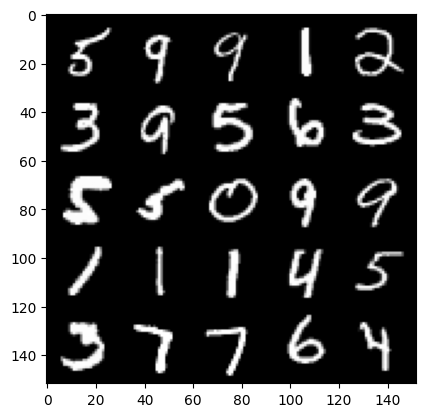

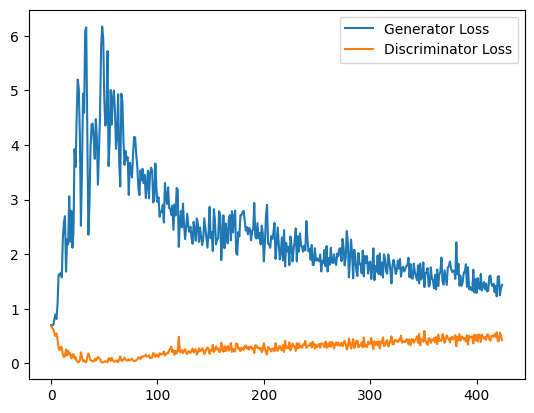

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 1.346096685051918, discriminator loss: 0.4922165778875351


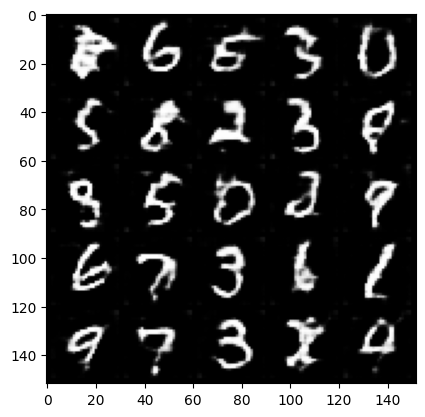

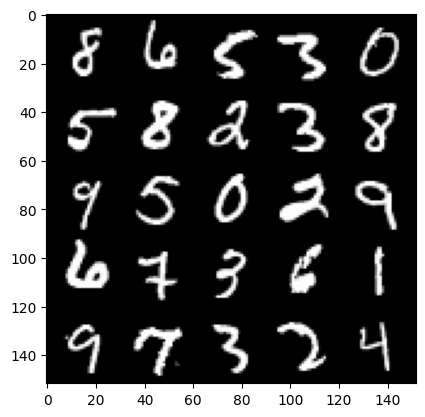

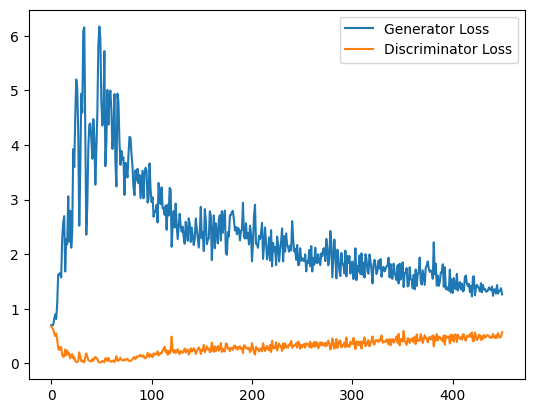

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 1.3258623138666152, discriminator loss: 0.5102554579973221


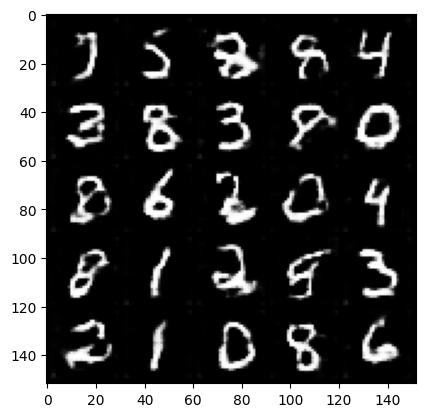

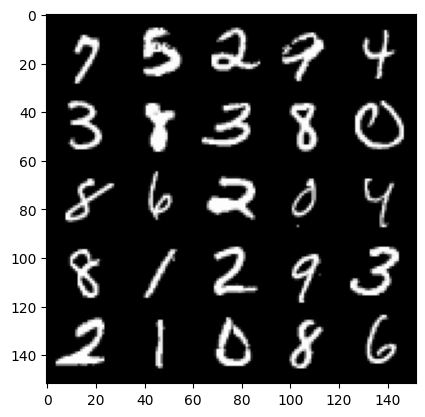

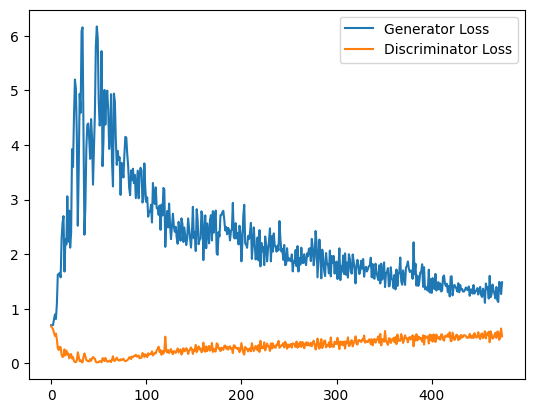

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 1.3641555116176605, discriminator loss: 0.5391520148515702


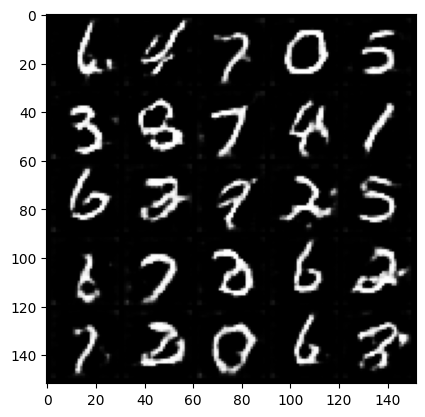

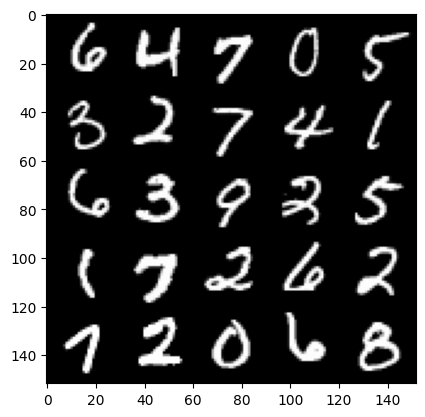

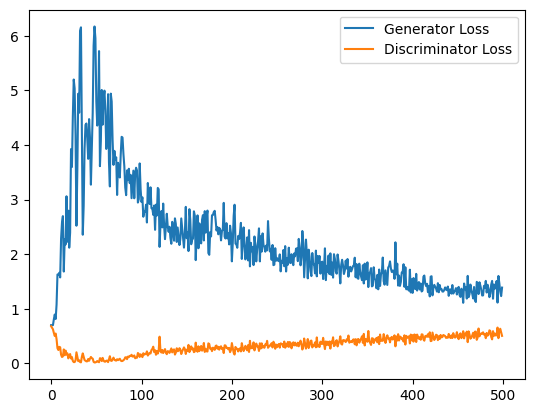

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 1.2997887086868287, discriminator loss: 0.5371237512230873


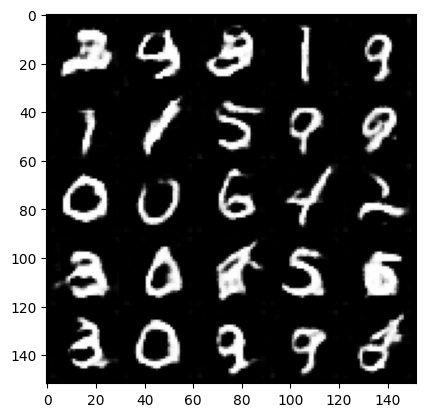

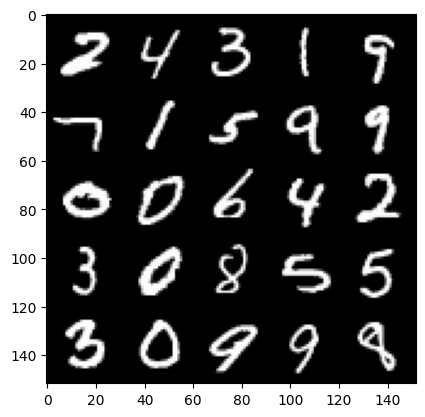

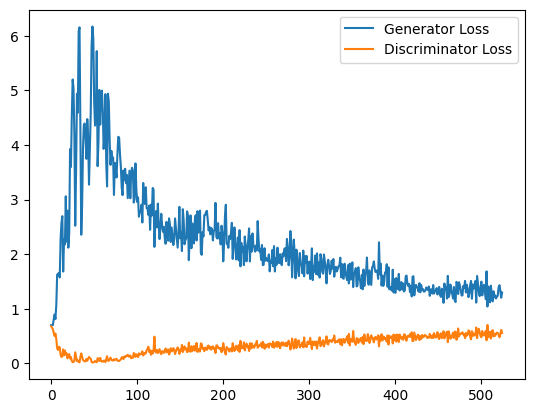

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 1.225727302789688, discriminator loss: 0.5465243698954583


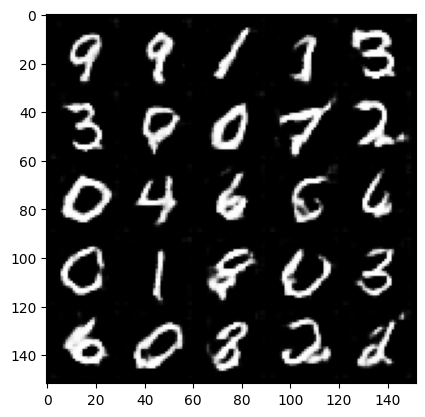

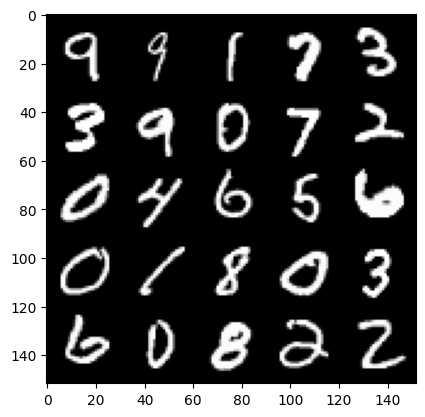

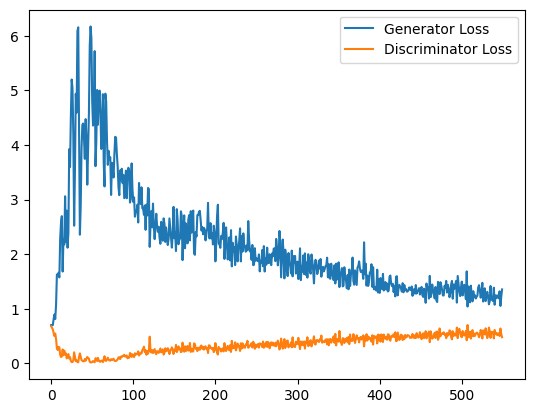

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 1.209033512711525, discriminator loss: 0.5559317926168442


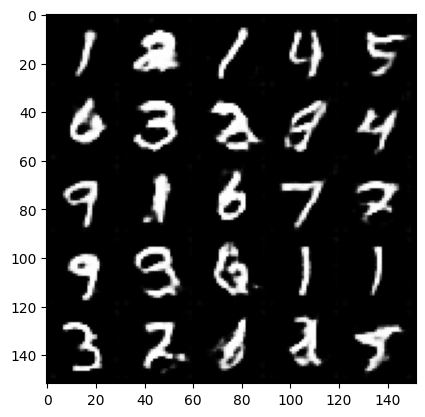

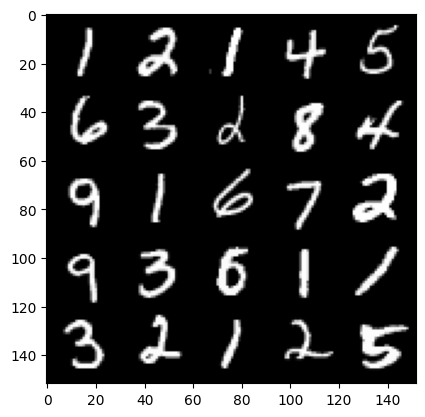

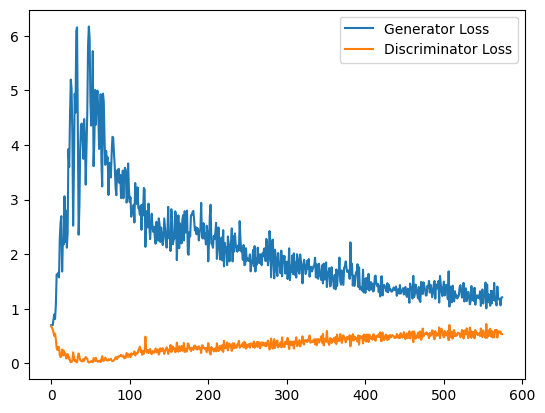

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 1.1982677367925645, discriminator loss: 0.5542168571352959


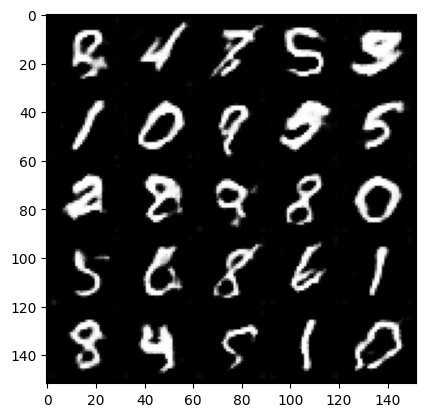

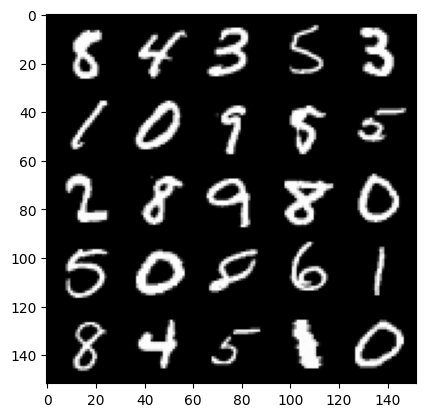

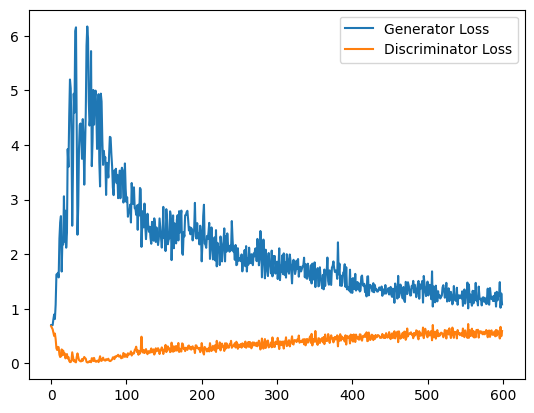

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 1.196646332502365, discriminator loss: 0.5520588295459747


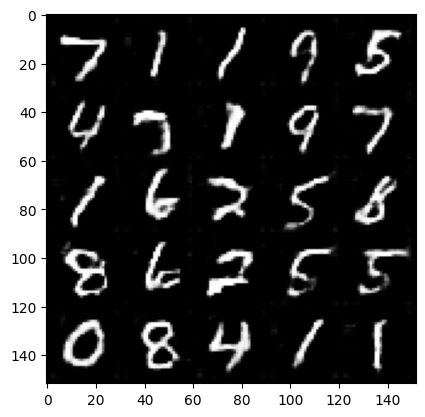

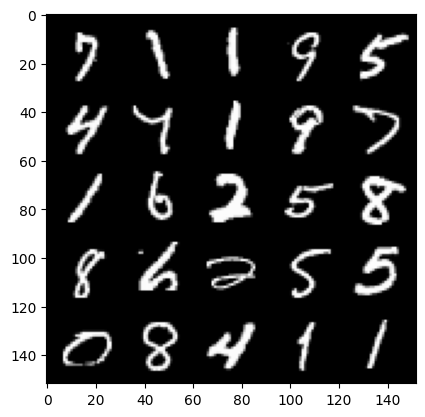

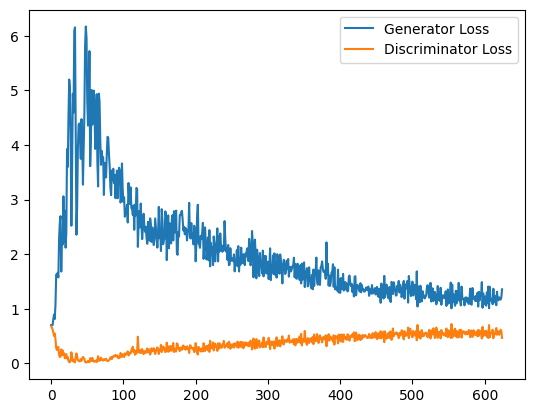

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 1.1607520164251328, discriminator loss: 0.5632852652668953


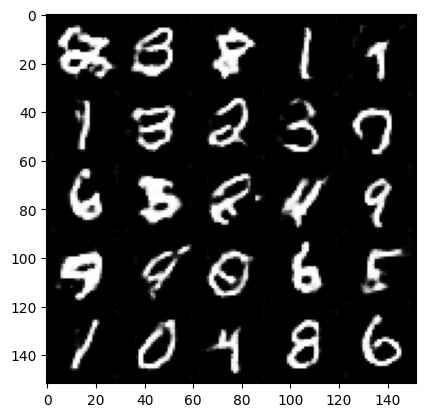

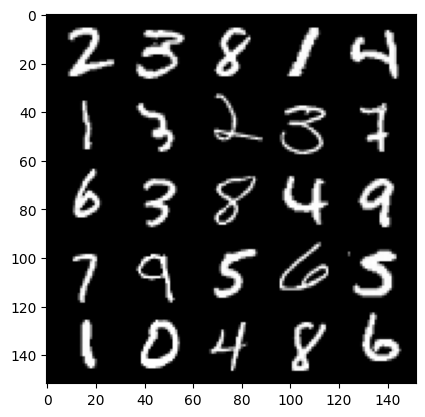

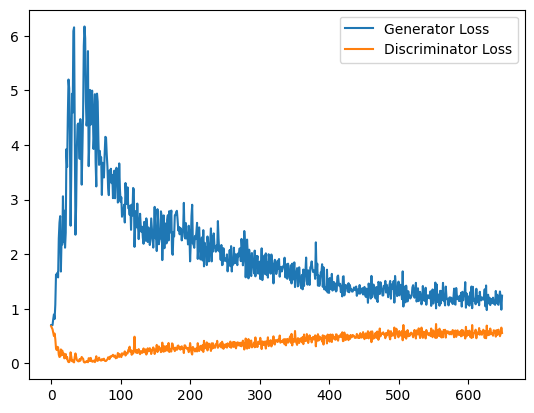

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 1.1424318038225174, discriminator loss: 0.5736581361293793


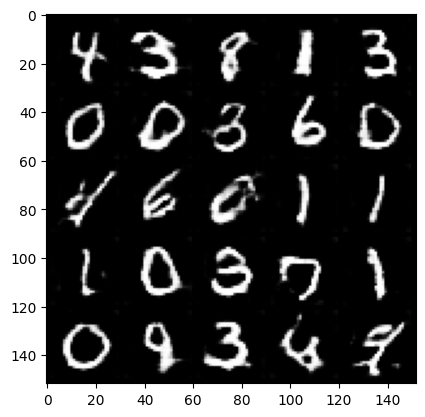

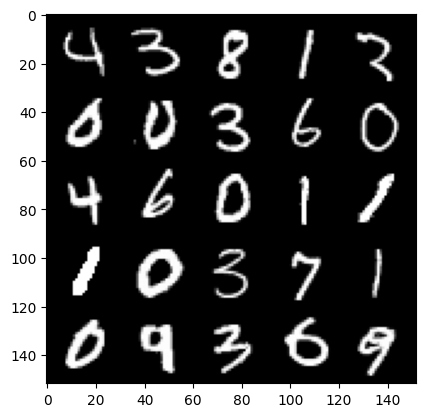

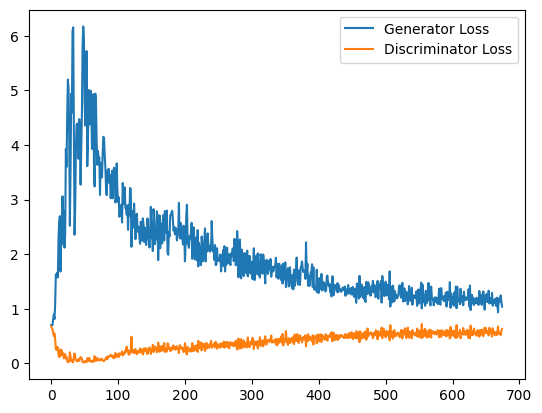

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 1.131470688343048, discriminator loss: 0.5699074275493622


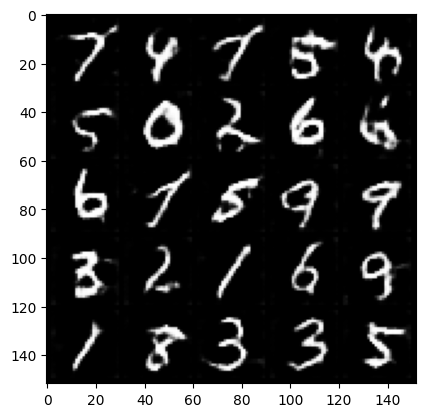

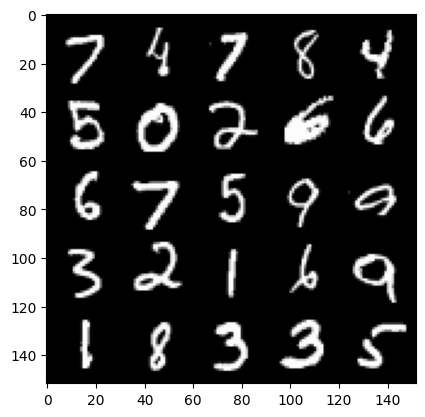

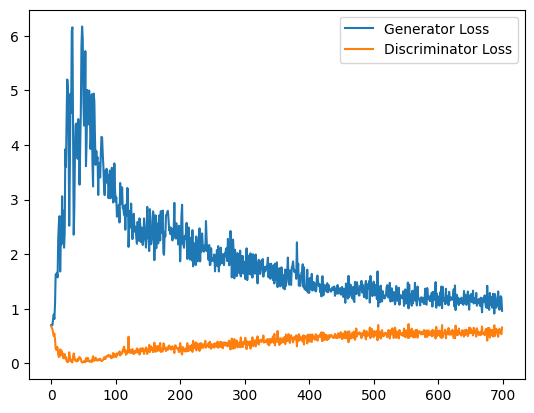

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 1.1149318071603775, discriminator loss: 0.572241634607315


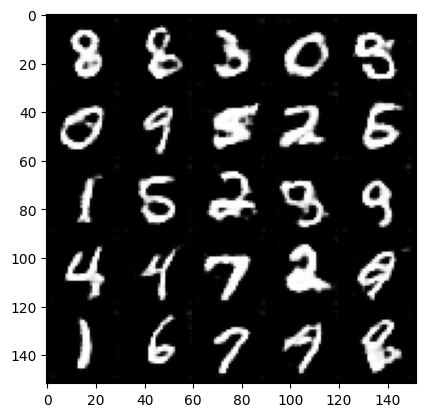

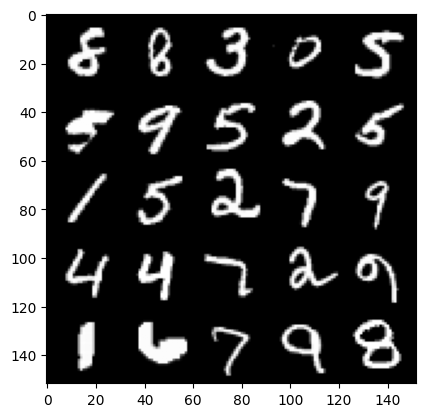

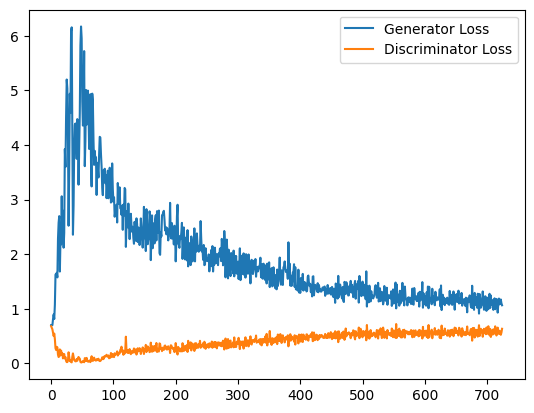

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 1.140333214521408, discriminator loss: 0.5767559788227081


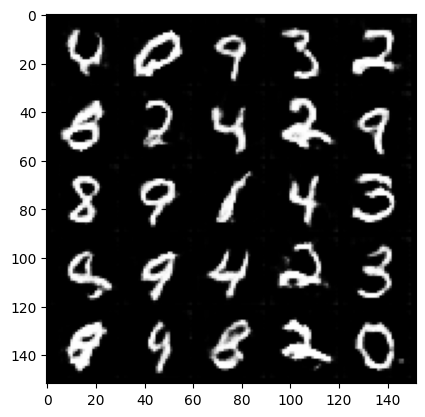

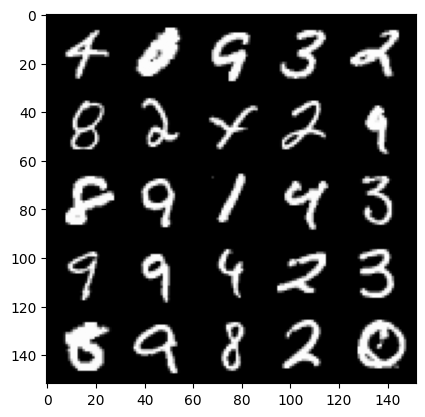

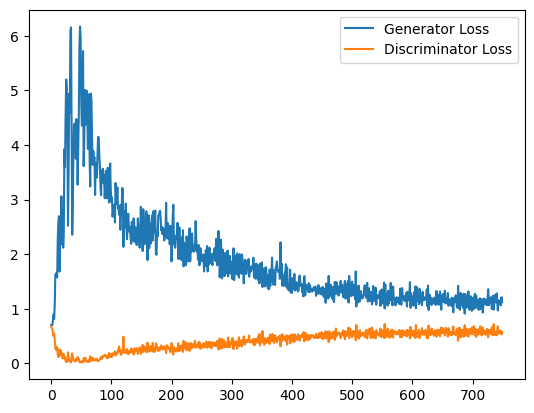

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 1.0994526938199998, discriminator loss: 0.5728810629844665


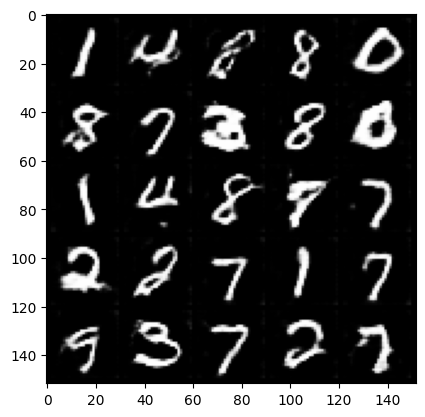

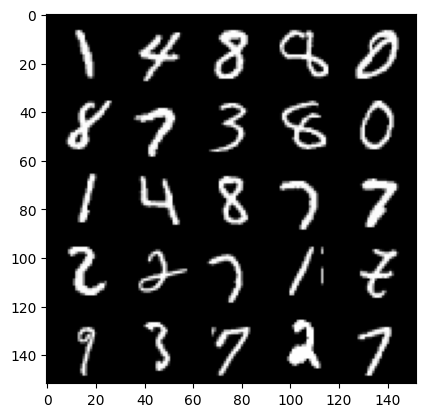

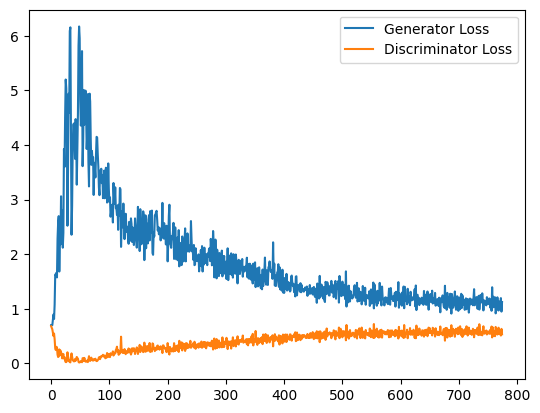

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 1.1042421967983247, discriminator loss: 0.5851136293411255


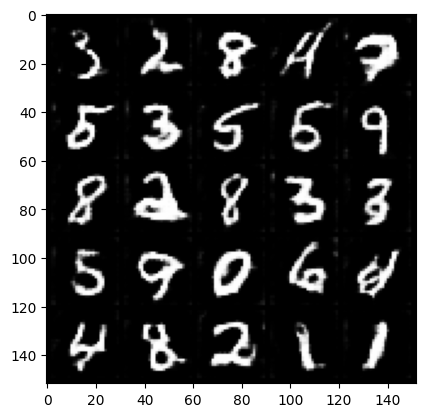

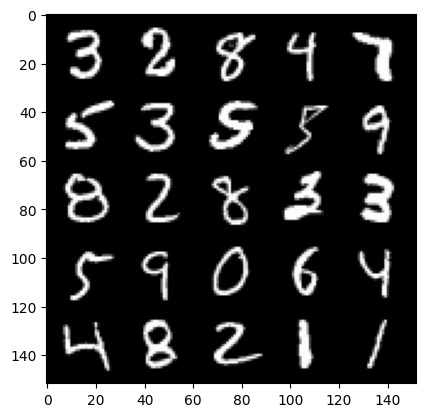

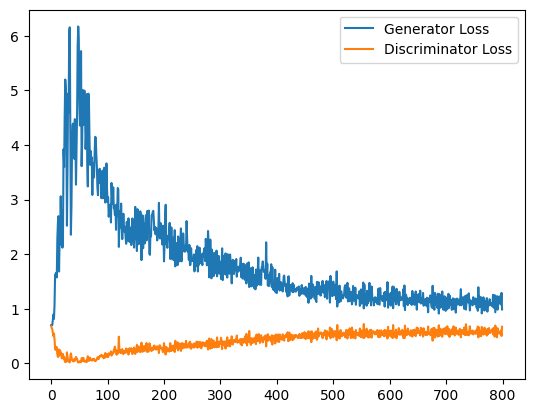

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 1.0742204905748367, discriminator loss: 0.5879003670215607


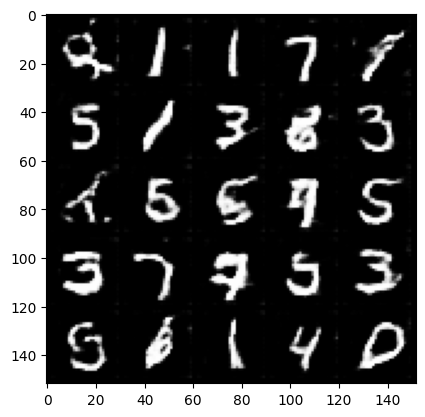

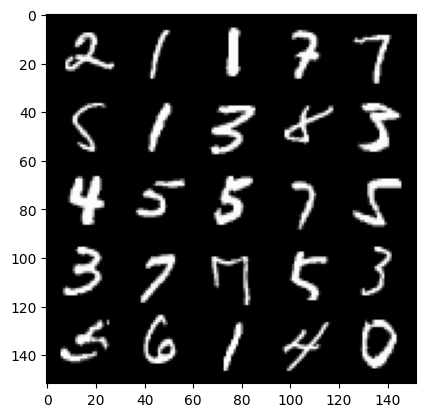

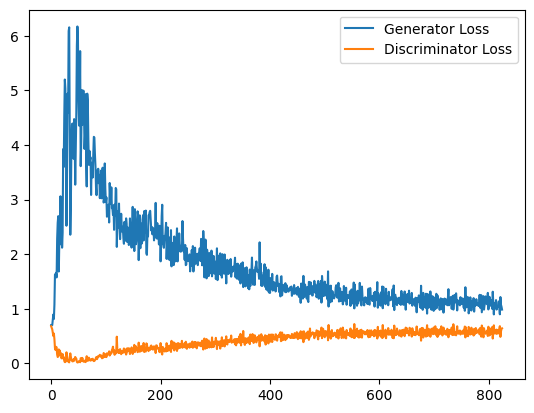

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 1.0614647351503372, discriminator loss: 0.587406281709671


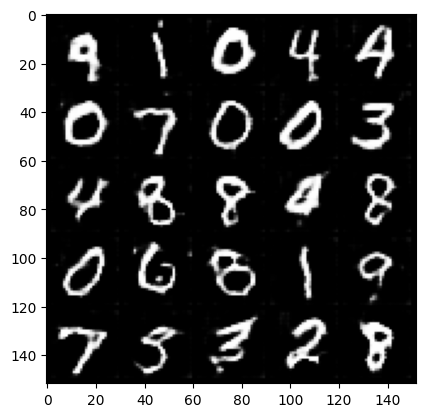

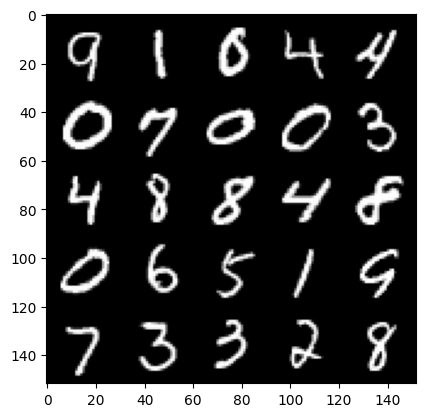

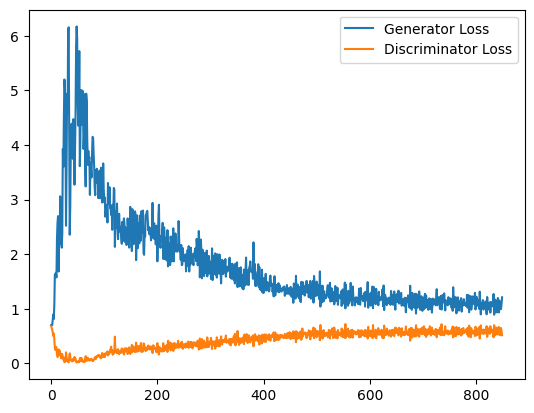

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 1.021774552345276, discriminator loss: 0.6002856343984604


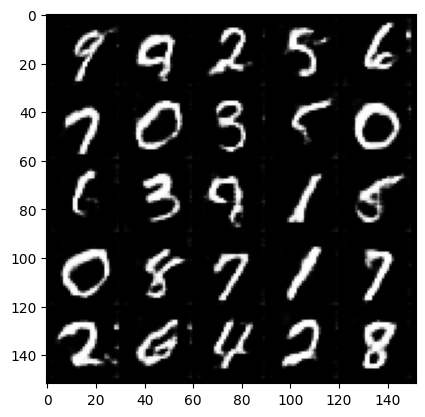

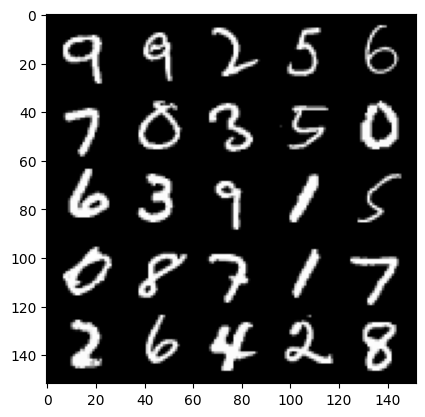

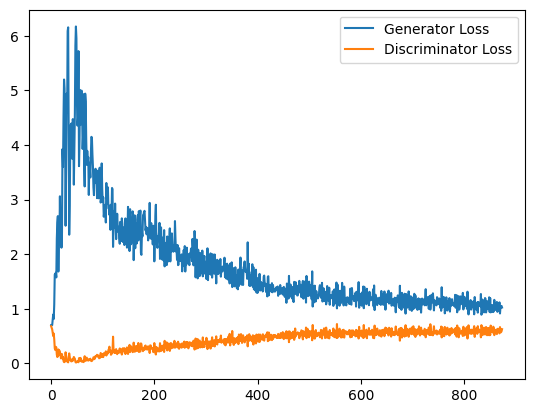

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 1.0692634116411208, discriminator loss: 0.5952268404364586


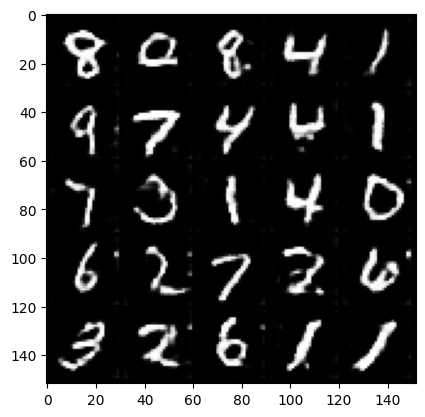

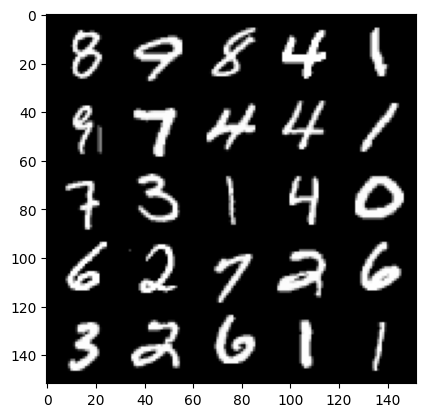

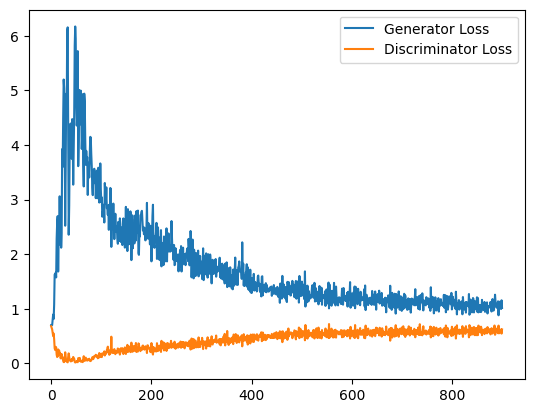

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 1.0545721546411515, discriminator loss: 0.5956923055648804


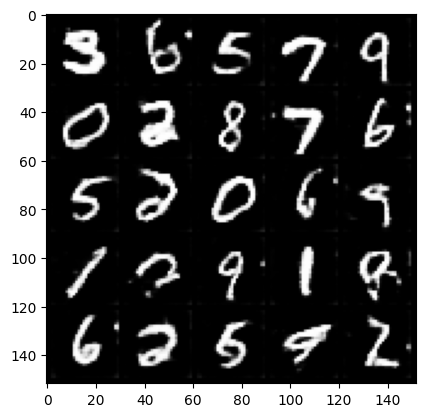

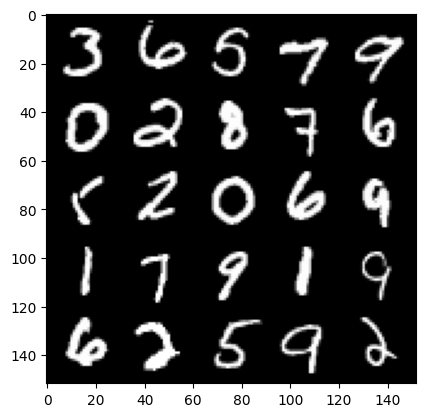

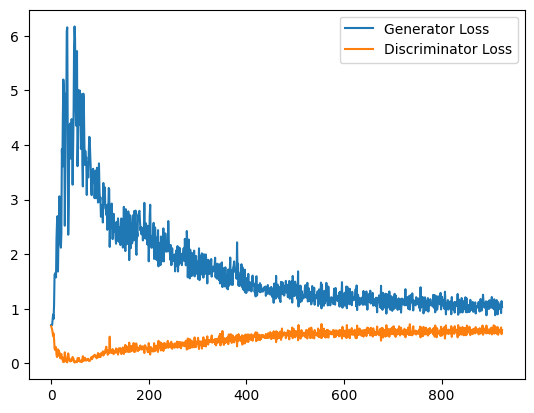

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 1.087143746137619, discriminator loss: 0.6050433245301247


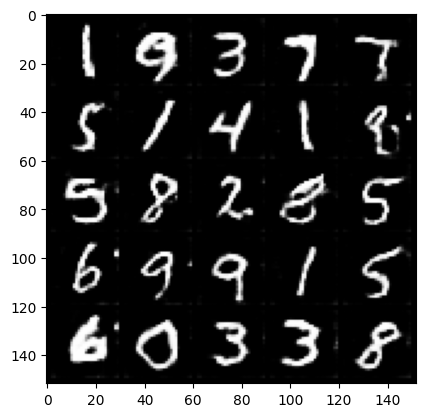

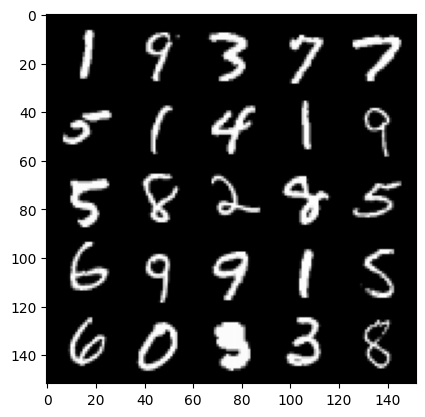

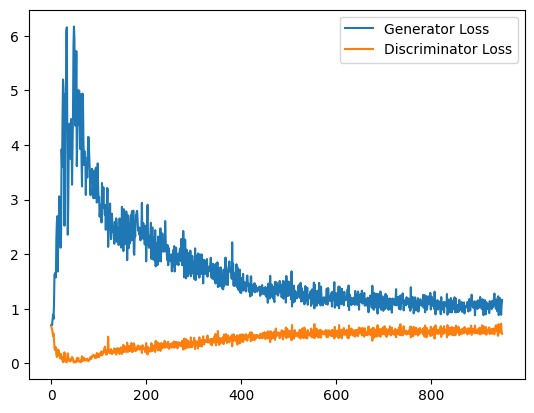

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 1.0046973850727081, discriminator loss: 0.6051932112574577


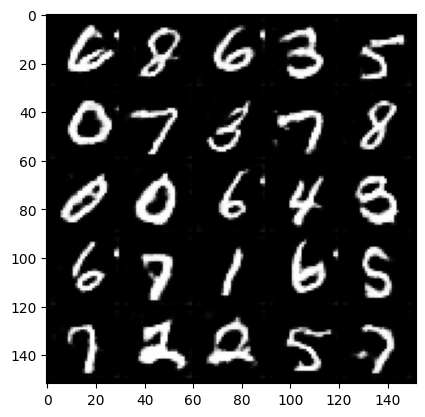

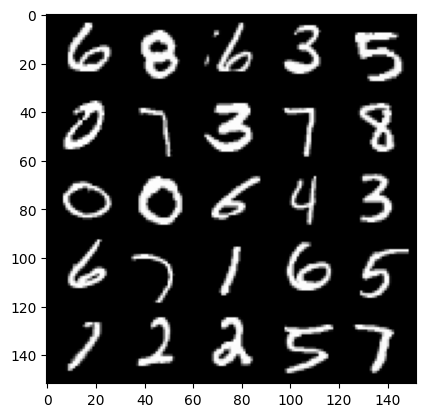

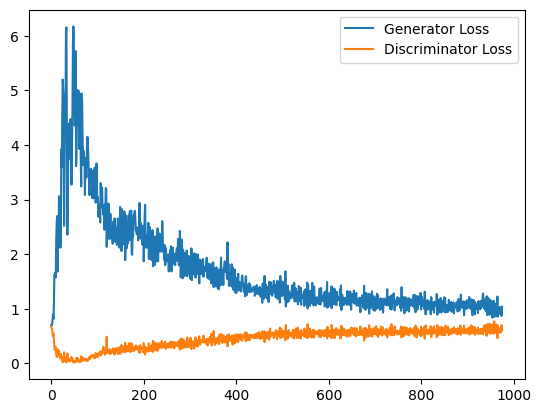

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 1.029599856376648, discriminator loss: 0.6031376032829284


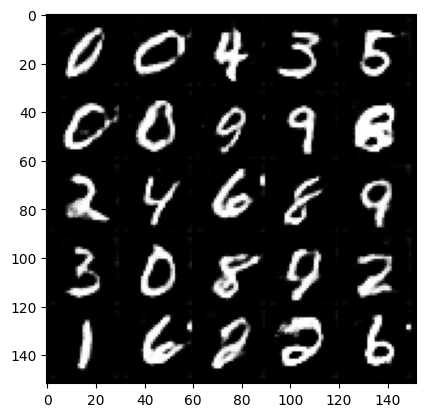

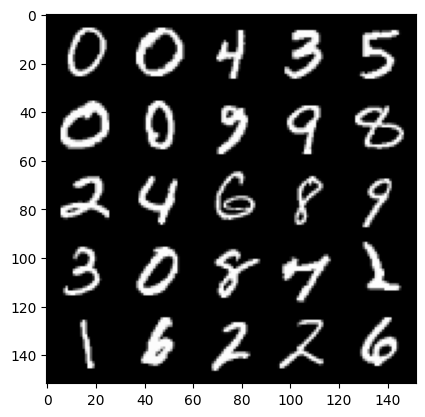

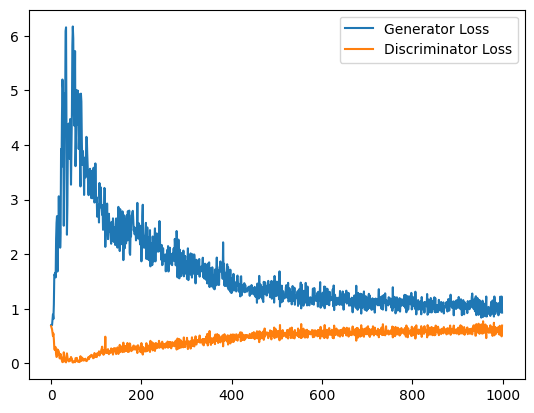

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 1.0276281725168228, discriminator loss: 0.6049307706356049


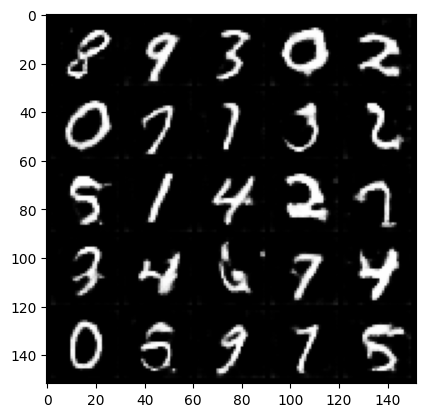

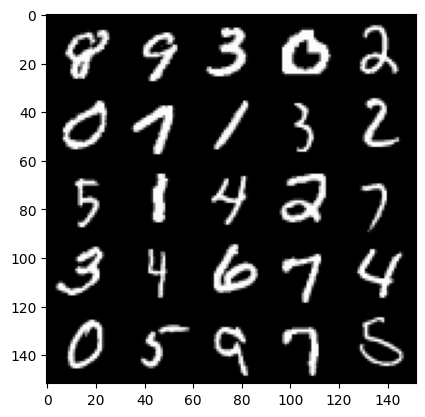

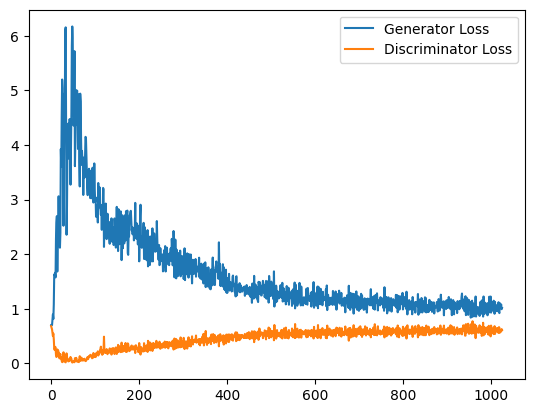

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 1.0178332560062409, discriminator loss: 0.6070166108608246


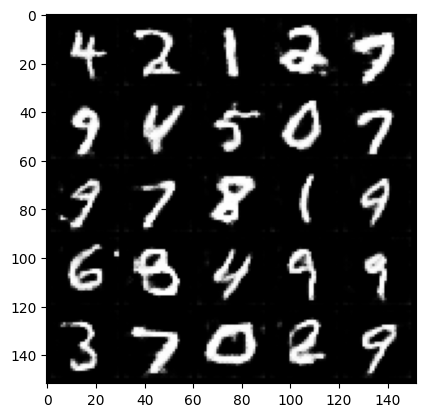

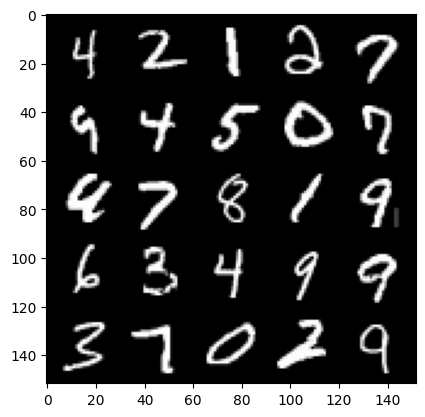

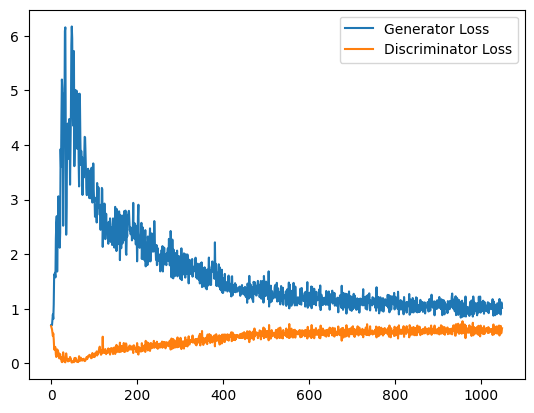

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 0.9764515061378479, discriminator loss: 0.6131630454659462


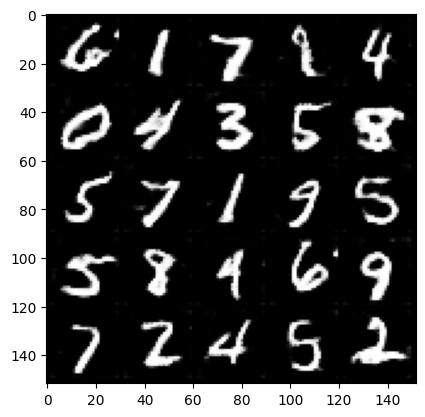

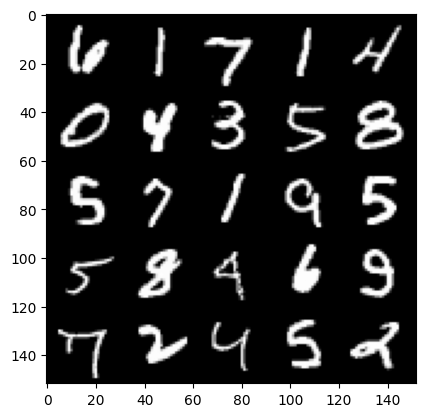

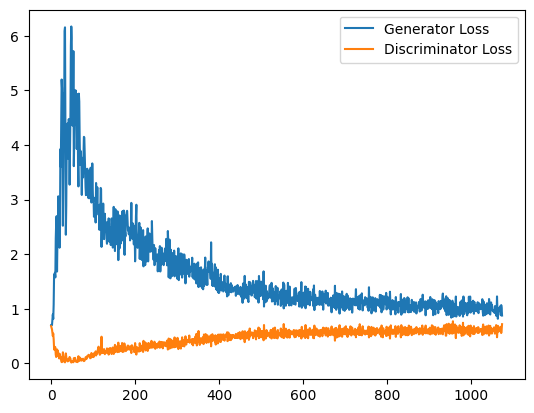

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 0.9949108539819718, discriminator loss: 0.6065447025895119


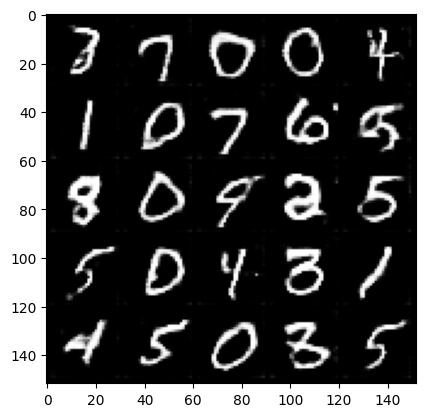

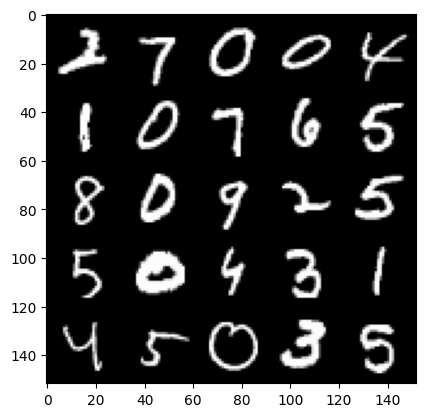

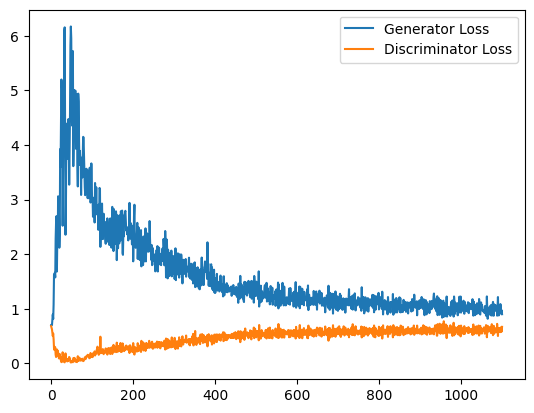

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 0.9549580928087235, discriminator loss: 0.6107785713672638


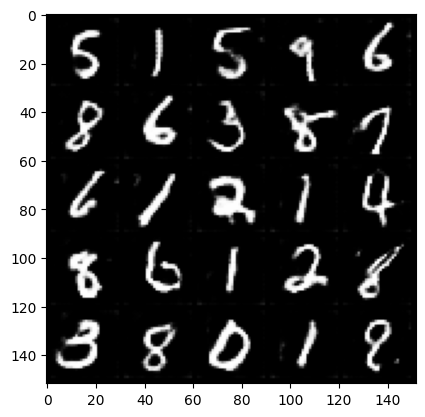

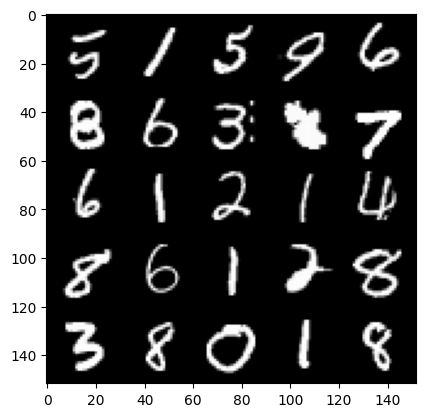

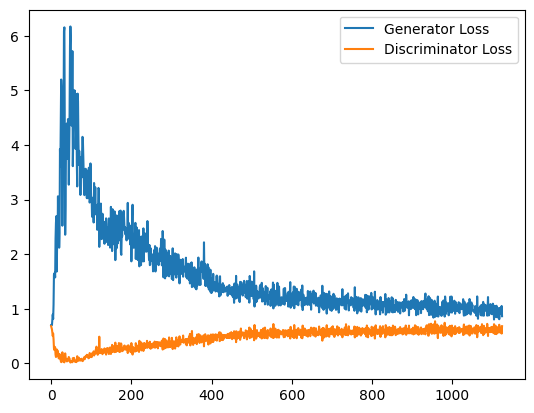

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 1.0084928432703018, discriminator loss: 0.6167771005034447


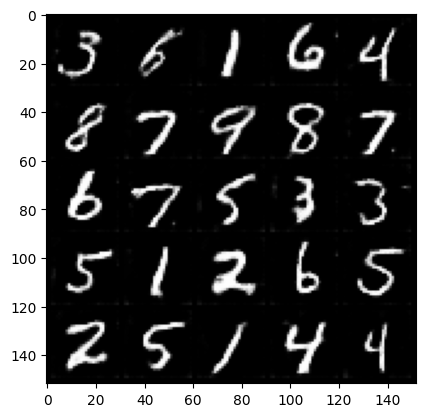

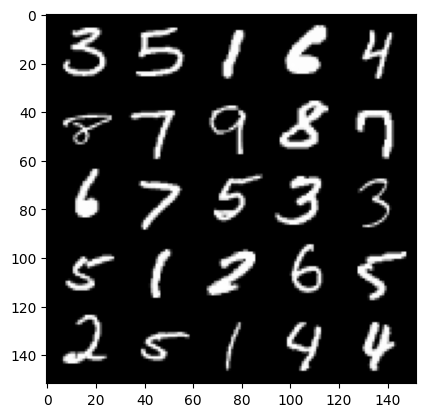

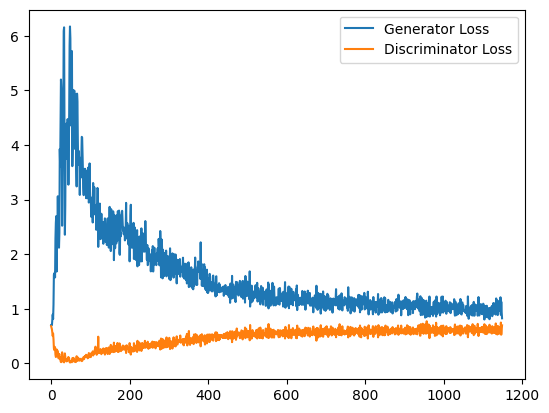

In [10]:
cur_step = 0
generator_losses = []
discriminator_losses = []

for epoch in range(n_epochs):
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)

        noise_and_labels = combine_vectors(fake_noise, one_hot_labels)
        fake = gen(noise_and_labels)


        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels.detach())
        disc_real_pred = disc(real_image_and_labels)

        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        discriminator_losses += [disc_loss.item()]

        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        generator_losses += [gen_loss.item()]

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        cur_step += 1

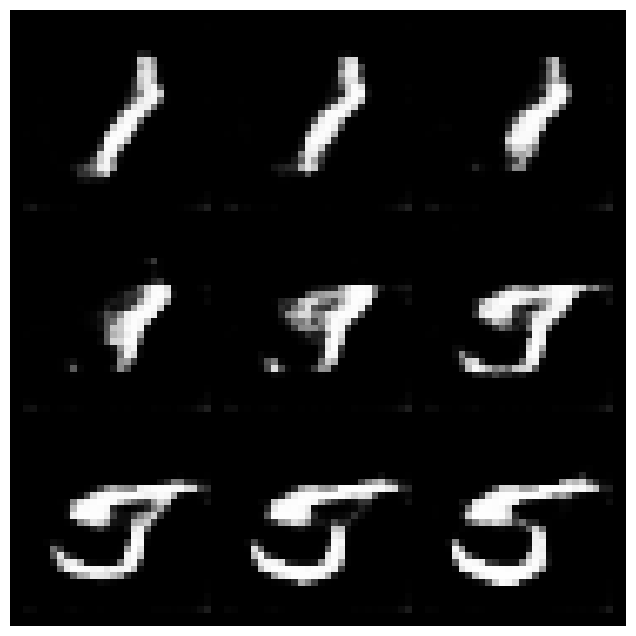

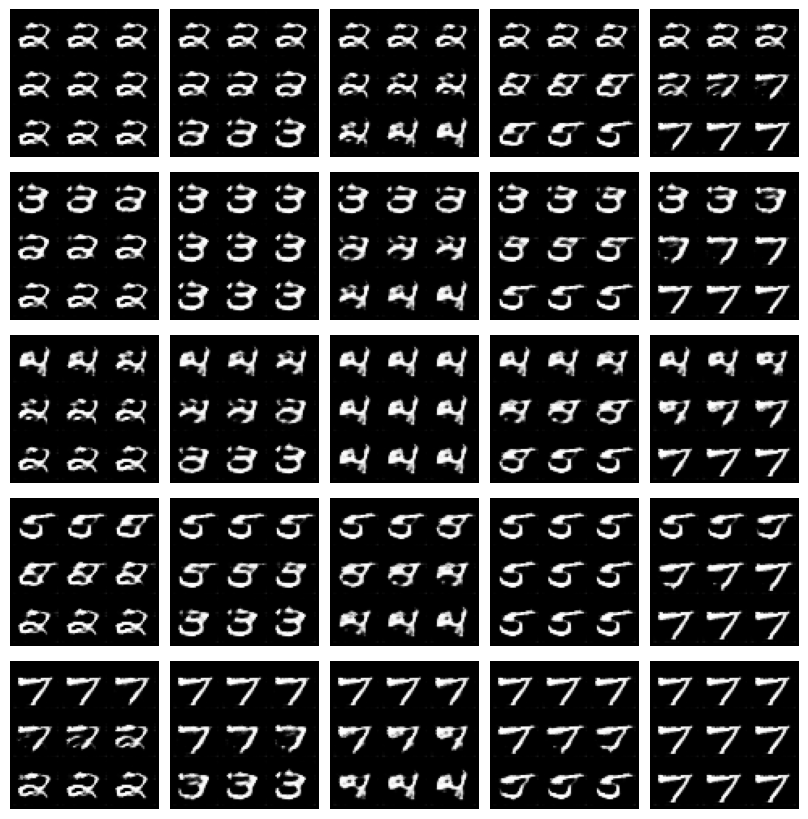

In [11]:
gen = gen.eval()
import math

n_interpolation = 9
interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation, 1)

def interpolate_class(first_number, second_number):
    first_label = get_one_hot_labels(torch.Tensor([first_number]).long(), n_classes)
    second_label = get_one_hot_labels(torch.Tensor([second_number]).long(), n_classes)


    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label

    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

start_plot_number = 1
end_plot_number = 5

plt.figure(figsize=(8, 8))
interpolate_class(start_plot_number, end_plot_number)
_ = plt.axis('off')

plot_numbers = [2, 3, 4, 5, 7]
n_numbers = len(plot_numbers)
plt.figure(figsize=(8, 8))
for i, first_plot_number in enumerate(plot_numbers):
    for j, second_plot_number in enumerate(plot_numbers):
        plt.subplot(n_numbers, n_numbers, i * n_numbers + j + 1)
        interpolate_class(first_plot_number, second_plot_number)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()

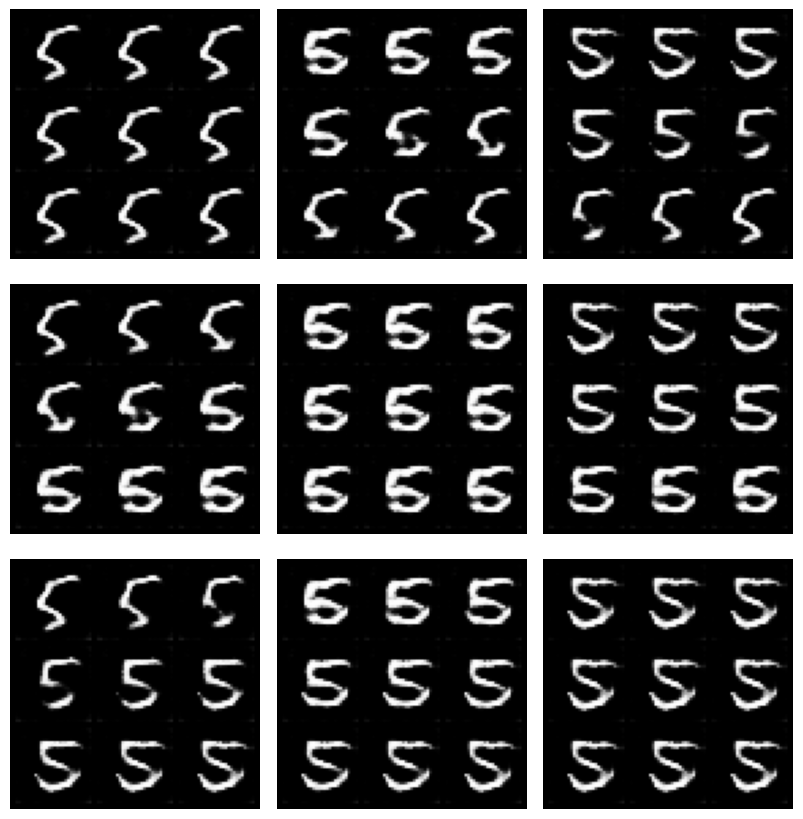

In [19]:
n_interpolation = 9

interpolation_label = get_one_hot_labels(torch.Tensor([5]).long(), n_classes).repeat(n_interpolation, 1).float()

def interpolate_noise(first_noise, second_noise):
    percent_first_noise = torch.linspace(0, 1, n_interpolation)[:, None].to(device)
    interpolation_noise = first_noise * percent_first_noise + second_noise * (1 - percent_first_noise)

    noise_and_labels = combine_vectors(interpolation_noise, interpolation_label.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

plot_noises = [get_noise(1, z_dim, device=device) for i in range(n_noise)]
plt.figure(figsize=(8, 8))
for i, first_plot_noise in enumerate(plot_noises):
    for j, second_plot_noise in enumerate(plot_noises):
        plt.subplot(n_noise, n_noise, i * n_noise + j + 1)
        interpolate_noise(first_plot_noise, second_plot_noise)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()

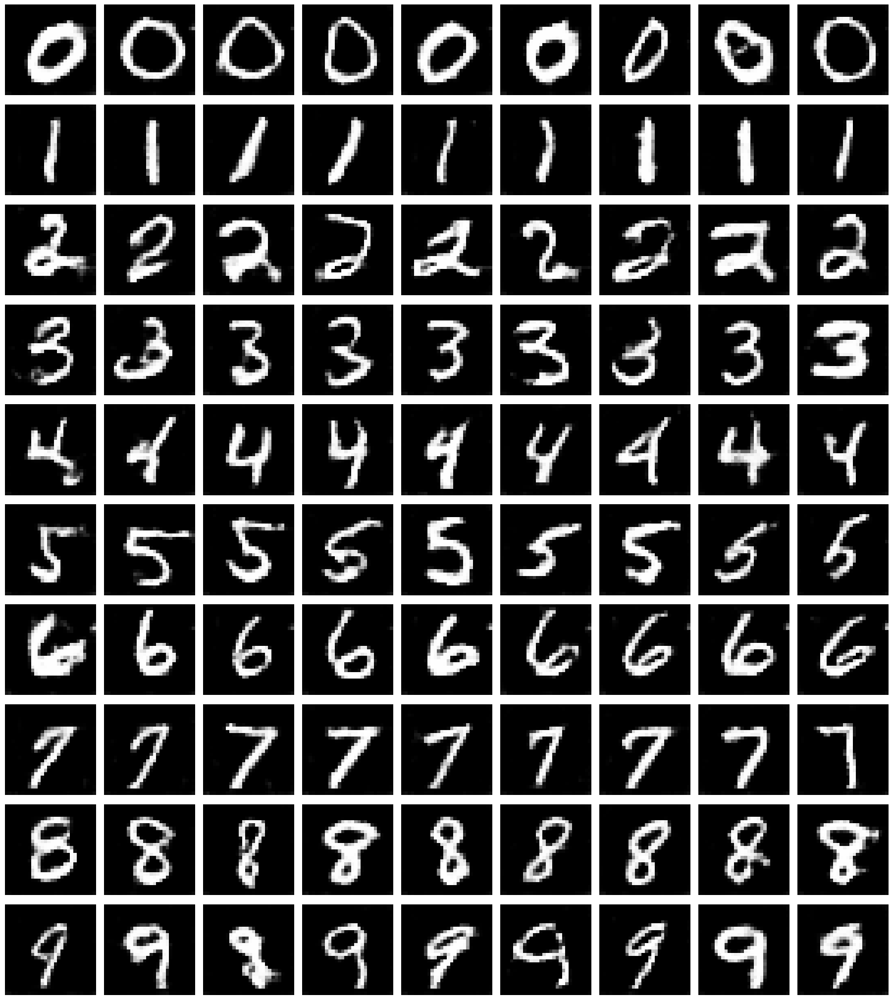

In [35]:
n_interpolation = 9

def generate_images(label, n_interpolation):
    noise_vectors = [get_noise(1, z_dim, device=device) for _ in range(n_interpolation)]
    interpolation_label = get_one_hot_labels(torch.Tensor([label]).long(), n_classes).repeat(n_interpolation, 1).float().to(device)
    noise_and_labels = combine_vectors(torch.cat(noise_vectors), interpolation_label)
    fake_images = gen(noise_and_labels)
    return fake_images


plt.figure(figsize=(18, 20))
for i in range(10):
    fake_images = generate_images(i, n_interpolation)
    for j in range(n_interpolation):
        plt.subplot(10, n_interpolation, i * n_interpolation + j + 1)
        show_tensor_images(fake_images[j].unsqueeze(0), num_images=1, show=False)
        plt.axis('off')

plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()